In [ ]:
import copy, os, sys
import argparse

import cv2
import torch
import numpy as np
# from tqdm import tqdm
from tqdm.notebook import tqdm
# import xformers
from diffusers import StableDiffusionPipeline, DDIMScheduler

from utils import * # image save utils
from stable_diffusion import encode_latent, decode_latent, get_text_embedding, get_unet_layers, attention_op  # load SD

In [28]:
# class for obtain and override the features
class StyleTransferModule():
    def __init__(self,
        cfg, style_transfer_params = None, guidance_scale= 0
    ):  
        
        self.cfg = cfg
        self.device = cfg.device
        self._load_stable_diffusion(sd_version=self.cfg.sd_version, precision_t=cfg.precision_t)

        style_transfer_params_default = {
            'gamma': 0.75,
            'tau': 1.5,
            'injection_layers': [7, 8, 9, 10, 11]
        }
        if style_transfer_params is not None:
            style_transfer_params_default.update(style_transfer_params)
        self.style_transfer_params = style_transfer_params_default

        self.guidance_scale = guidance_scale 

        self.attn_features = {} # where to save key value (attention block feature)
        self.attn_features_modify = {} # where to save key value to modify (attention block feature)

        self.cur_t = None
        
        # Get residual and attention block in decoder
        # [0 ~ 11], total 12 layers
        resnet, attn = get_unet_layers(self.unet)
        
        # where to inject key and value
        qkv_injection_layer_num = self.style_transfer_params['injection_layers']
    
        
        for i in qkv_injection_layer_num:
            self.attn_features["layer{}_attn".format(i)] = {}
            attn[i].transformer_blocks[0].attn1.register_forward_hook(self.__get_query_key_value("layer{}_attn".format(i)))
        
        # Modify hook (if you change query key value)
        for i in qkv_injection_layer_num:
            attn[i].transformer_blocks[0].attn1.register_forward_hook(self.__modify_self_attn_qkv("layer{}_attn".format(i)))
        
        # triggers for obtaining or modifying features
        
        self.trigger_get_qkv = False # if set True --> save attn qkv in self.attn_features
        self.trigger_modify_qkv = False # if set True --> save attn qkv by self.attn_features_modify
        
        self.modify_num = None # ignore
        self.modify_num_sa = None # ignore


    def _load_stable_diffusion(self, sd_version='2.1', precision_t=torch.float32):
        if sd_version == '2.1':
            model_key = "/sun/home_models/stable-diffusion-2-1"
        elif sd_version == '2.1-base':
            model_key = "/sun/home_models/stable-diffusion-2-1-base"
        elif sd_version == '2.0':
            model_key = "/sun/home_models/stable-diffusion-2-base"
        elif sd_version == '1.5':
            model_key = "/sun/home_models/stable-diffusion-v1-5"
        elif sd_version == '3-medium':
            model_key = "/sun/home_models/stable-diffusion-3-medium"
        elif sd_version == '3.5-medium':
            model_key = "/sun/home_models/stable-diffusion-3.5-medium"
            
        # Create model
        pipe = StableDiffusionPipeline.from_pretrained(model_key, torch_dtype=precision_t)
        
        vae = pipe.vae
        text_encoder = pipe.text_encoder
        unet = pipe.unet
        tokenizer = pipe.tokenizer
        
        vae.to(self.device)
        text_encoder.to(self.device)
        unet.to(self.device)

        self.vae = vae
        self.text_encoder = text_encoder
        self.unet = unet # SD unet
        self.tokenizer = tokenizer
        
        self.unet.enable_xformers_memory_efficient_attention()
        del pipe
        
        # Use DDIM scheduler
        scheduler = DDIMScheduler.from_pretrained(model_key, subfolder="scheduler", torch_dtype=precision_t)
        scheduler.set_timesteps(self.cfg.ddim_steps)
        self.scheduler = scheduler
    

    def get_text_condition(self, text):
        if text is None:
            uncond_input = self.tokenizer(
                [""], padding="max_length", max_length=self.tokenizer.model_max_length, return_tensors="pt"
            )
            uncond_embeddings = self.text_encoder(uncond_input.input_ids.to(self.device))[0].to(self.device)
            return {'encoder_hidden_states': uncond_embeddings}
        
        text_embeddings, uncond_embeddings = get_text_embedding(text, self.text_encoder, self.tokenizer)
        text_cond = [text_embeddings, uncond_embeddings]
        denoise_kwargs = {
            'encoder_hidden_states': torch.cat(text_cond)
        }
        return denoise_kwargs

    def reverse_process(self, input, denoise_kwargs):
        pred_images = []
        pred_latents = []
        
        decode_kwargs = {'vae': self.vae}
        
        # Reverse diffusion process
        for t in tqdm(self.scheduler.timesteps):
            
            # setting t (for saving time step)
            self.cur_t = t.item()
            
            with torch.no_grad():
                # For text condition on stable diffusion
                if 'encoder_hidden_states' in denoise_kwargs.keys():
                    bs = denoise_kwargs['encoder_hidden_states'].shape[0]
                    input = torch.cat([input] * bs)
                
                noisy_residual = self.unet(input, t.to(input.device), **denoise_kwargs).sample
                    
                # For text condition on stable diffusion
                if noisy_residual.shape[0] == 2:
                    # perform guidance
                    noise_pred_text, noise_pred_uncond = noisy_residual.chunk(2)
                    noisy_residual = noise_pred_uncond + self.guidance_scale * (noise_pred_text - noise_pred_uncond)
                    input, _ = input.chunk(2)

                prev_noisy_sample = self.scheduler.step(noisy_residual, t, input).prev_sample                # coef * P_t(e_t(x_t)) + D_t(e_t(x_t))
                pred_original_sample = self.scheduler.step(noisy_residual, t, input).pred_original_sample    # D_t(e_t(x_t))
                
                input = prev_noisy_sample
                
                pred_latents.append(pred_original_sample)
                pred_images.append(decode_latent(pred_original_sample, **decode_kwargs))
                
        return pred_images, pred_latents

    ## Inversion (https://github.com/huggingface/diffusion-models-class/blob/main/unit4/01_ddim_inversion.ipynb)
    def invert_process(self, input, denoise_kwargs):

        pred_images = []
        pred_latents = []
        
        decode_kwargs = {'vae': self.vae}

        # Reversed timesteps <<<<<<<<<<<<<<<<<<<<
        timesteps = reversed(self.scheduler.timesteps)
        num_inference_steps = len(self.scheduler.timesteps)
        cur_latent = input.clone()

        with torch.no_grad():
            for i in tqdm(range(0, num_inference_steps)):

                t = timesteps[i]
                
                self.cur_t = t.item()
                
                # For text condition on stable diffusion
                if 'encoder_hidden_states' in denoise_kwargs.keys():
                    bs = denoise_kwargs['encoder_hidden_states'].shape[0]
                    cur_latent = torch.cat([cur_latent] * bs)

                # Predict the noise residual
                noise_pred = self.unet(cur_latent, t.to(cur_latent.device), **denoise_kwargs).sample

                # For text condition on stable diffusion
                if noise_pred.shape[0] == 2:
                    # perform guidance
                    noise_pred_text, noise_pred_uncond = noise_pred.chunk(2)
                    noise_pred = noise_pred_uncond + self.guidance_scale * (noise_pred_text - noise_pred_uncond)
                    cur_latent, _ = cur_latent.chunk(2)

                current_t = max(0, t.item() - (1000//num_inference_steps)) #t
                next_t = t # min(999, t.item() + (1000//num_inference_steps)) # t+1
                alpha_t = self.scheduler.alphas_cumprod[current_t]
                alpha_t_next = self.scheduler.alphas_cumprod[next_t]

                if self.cfg.sd_version == "2.1":
                    beta_t = 1 - alpha_t
                    pred_original_sample = alpha_t.sqrt() * cur_latent - beta_t.sqrt() * noise_pred
                    pred_epsilon = alpha_t.sqrt() * noise_pred + beta_t.sqrt() * cur_latent
                    pred_sample_direction = (1 - alpha_t_next).sqrt() * pred_epsilon
                    cur_latent = alpha_t_next.sqrt() * pred_original_sample + pred_sample_direction
                else:
                    # Inverted update step (re-arranging the update step to get x(t) (new latents) as a function of x(t-1) (current latents)
                    cur_latent = (cur_latent - (1-alpha_t).sqrt()*noise_pred)*(alpha_t_next.sqrt()/alpha_t.sqrt()) + (1-alpha_t_next).sqrt()*noise_pred
                
                pred_latents.append(cur_latent)
                pred_images.append(decode_latent(cur_latent, **decode_kwargs))
                
        return pred_images, pred_latents

    # ============================ hook operations ===============================
    # save key value in self.original_kv[name]
    def __get_query_key_value(self, name):
        def hook(model, input, output):
            
            if self.trigger_get_qkv:
                    
                _, query, key, value, _ = attention_op(model, input[0])
                
                self.attn_features[name][int(self.cur_t)] = (query.detach(), key.detach(), value.detach())
            
        return hook

    def __modify_self_attn_qkv(self, name):
        def hook(model, input, output):
        
            if self.trigger_modify_qkv:
                module_name = name # TODO
                
                _, q_cs, k_cs, v_cs, _ = attention_op(model, input[0])
                
                q_c, k_s, v_s = self.attn_features_modify[name][int(self.cur_t)]
                
                # style injection
                q_hat_cs = q_c * self.style_transfer_params['gamma'] + q_cs * (1 - self.style_transfer_params['gamma'])
                k_cs, v_cs = k_s, v_s
                
                # Replace query key and value
                _, _, _, _, modified_output = attention_op(model, input[0], key=k_cs, value=v_cs, query=q_hat_cs, temperature=self.style_transfer_params['tau'])
                
                return modified_output
        
        return hook

In [21]:
parse = argparse.ArgumentParser()

# hyperparameter of StyleID
parse.add_argument('--T', type=int, default=1.5)
parse.add_argument('--gamma', type=int, default=0.75)
parse.add_argument('--without_init_adain', action='store_true')
parse.add_argument('--without_attn_injection', action='store_true')
parse.add_argument('--layers', nargs='+', type=int, default=[7, 8, 9, 10, 11])

# hyperparameters of diffusion model
parse.add_argument('--ddim_steps', type=int, default=20)
parse.add_argument('--sd_version', type=str, choices=["1.5", "2.0", "2.1-base", "2.1", "3.5-medium"], default="2.1-base")

# path of content and style iamges
parse.add_argument('--cnt_fn', type=str, required=True)
parse.add_argument('--sty_fn', type=str, required=True)
parse.add_argument('--save_dir', type=str, default='results')

cfg = parse.parse_args(["--cnt_fn","../data/cnt/00.png", "--sty_fn","../data/sty/00.png","--sd_version","2.1"])

In [22]:
cfg.device = "cuda"
cfg.precision_t = torch.float32

In [23]:
cfg

Namespace(T=1.5, gamma=0.75, without_init_adain=False, without_attn_injection=False, layers=[7, 8, 9, 10, 11], ddim_steps=20, sd_version='2.1', cnt_fn='../data/cnt/00.png', sty_fn='../data/sty/00.png', save_dir='results', device='cuda', precision_t=torch.float32)

In [24]:
# Result save at save_dir
save_dir = cfg.save_dir

os.makedirs(save_dir, exist_ok=True)
os.makedirs(save_dir + '/intermediate', exist_ok=True)

# options
device = cfg.device
ddim_steps = cfg.ddim_steps
dtype = torch.float32
in_c = 4
guidance_scale = 0. # no text


style_transfer_params = {
    'gamma': cfg.gamma,
    'tau': cfg.T,
    'injection_layers': cfg.layers,
}


In [29]:
# Init style transfer module
unet_wrapper = StyleTransferModule(cfg, style_transfer_params=style_transfer_params)
sample_size = unet_wrapper.unet.config.sample_size

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [30]:
# ###############################################################
# Get style image tokens
# ###############################################################
style_text = None

denoise_kwargs = unet_wrapper.get_text_condition(style_text)

style_image = cv2.imread(cfg.sty_fn)[:, :, ::-1]

unet_wrapper.trigger_get_qkv = True # get attention features (key, value)
unet_wrapper.trigger_modify_qkv = False
style_latent = encode_latent(normalize(style_image).to(device=device, dtype=dtype), unet_wrapper.vae)
# invert process
print("Invert style image...")
images, latents = unet_wrapper.invert_process(style_latent, denoise_kwargs=denoise_kwargs) # reverse process save activations such as attn, res
style_latent = latents[-1]
# save image?
images = [denormalize(input)[0] for input in images]
image_last = images[-1]
images = np.concatenate(images, axis=1)

# save_image(images, os.path.join(save_dir, "intermediate/inversion_style.jpg"))
# save_image(image_last, os.path.join(save_dir, "intermediate/latent_style.jpg"))

# save key value from style image
style_features = copy.deepcopy(unet_wrapper.attn_features)

# ###############################################################
# Get content image tokens
# ###############################################################
content_text = None
denoise_kwargs = unet_wrapper.get_text_condition(content_text)

unet_wrapper.trigger_get_qkv = True
unet_wrapper.trigger_modify_qkv = False

content_image = cv2.imread(cfg.cnt_fn)[:, :, ::-1]
content_latent = encode_latent(normalize(content_image).to(device=device, dtype=dtype), unet_wrapper.vae)

# invert process
print("Invert content image...")
images, latents = unet_wrapper.invert_process(content_latent, denoise_kwargs=denoise_kwargs) # reverse process save activations such as attn, res
content_latent = latents[-1]

# save image?
images = [denormalize(input)[0] for input in images]
image_last = images[-1]
images = np.concatenate(images, axis=1)

# save_image(images, os.path.join(save_dir, "intermediate/inversion_style.jpg"))
# save_image(image_last, os.path.join(save_dir, "intermediate/latent_content.jpg"))

# save res feature from content image
content_features = copy.deepcopy(unet_wrapper.attn_features)

Invert style image...


  0%|          | 0/20 [00:00<?, ?it/s]

Invert content image...


  0%|          | 0/20 [00:00<?, ?it/s]

Style transfer...


  0%|          | 0/20 [00:00<?, ?it/s]

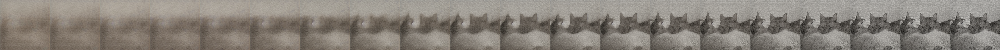

In [31]:
# ================= IMPORTANT =================
# Set modify features
for layer_name in style_features.keys():
    unet_wrapper.attn_features_modify[layer_name] = {}
    for t in unet_wrapper.scheduler.timesteps:
        t = t.item()
        unet_wrapper.attn_features_modify[layer_name][t] = (content_features[layer_name][t][0], style_features[layer_name][t][1], style_features[layer_name][t][2]) # content as q / style as kv        
# =============================================

unet_wrapper.trigger_get_qkv = False
unet_wrapper.trigger_modify_qkv = not cfg.without_attn_injection # modify attn feature (key value)

# Generate style transferred image
denoise_kwargs = unet_wrapper.get_text_condition(content_text)

if cfg.without_init_adain:
    latent_cs = content_latent
else:
    latent_cs = (content_latent - content_latent.mean(dim=(2, 3), keepdim=True)) / (content_latent.std(dim=(2, 3), keepdim=True) + 1e-4) * style_latent.std(dim=(2, 3), keepdim=True) + style_latent.mean(dim=(2, 3), keepdim=True)

# reverse process
print("Style transfer...")
images, latents = unet_wrapper.reverse_process(latent_cs, denoise_kwargs=denoise_kwargs) # reverse process save activations such as attn, res

# save image
images = [denormalize(input)[0] for input in images]
image_last = images[-1]
images = np.concatenate(images, axis=1)

# save_image(images, os.path.join(save_dir, "reverse_stylized.jpg"))
# save_image(image_last, os.path.join(save_dir, "stylized_image.jpg"))
Image.fromarray(images)

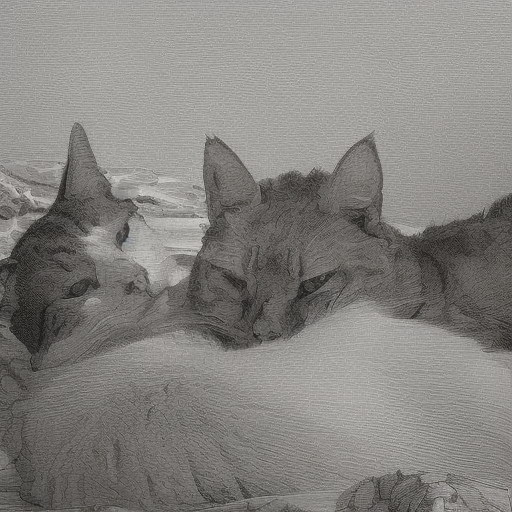

In [32]:
Image.fromarray(image_last)